# 05 - Grad-CAM++ Explainability

Implementazione di Grad-CAM++ per l'interpretabilita del modello CNN.

**Fase 2 del progetto**: Explainability Analysis

**Obiettivi**:
- Implementare Grad-CAM++ per visualizzare le regioni rilevanti
- Generare saliency maps per ogni classe DR
- Salvare visualizzazioni per analisi qualitativa

**Riferimento Paper**:
- Grad-CAM++: Generalized Gradient-based Visual Explanations for Deep Convolutional Networks (Chattopadhyay et al., 2018)

## 1. Setup e Caricamento Modello

In [2]:
import os
import sys
from pathlib import Path
import warnings
warnings.filterwarnings('ignore')

# Manipolazione dati
import pandas as pd
import numpy as np

# Configurazione
import yaml

# Deep Learning
import torch
import torch.nn as nn
import torch.nn.functional as F

# Modelli
import timm

# Elaborazione immagini
import cv2
from PIL import Image
import albumentations as A
from albumentations.pytorch import ToTensorV2

# Visualizzazione
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# Progress bar
from tqdm.auto import tqdm

# Impostazioni visualizzazione
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 11

print(f"PyTorch version: {torch.__version__}")
print(f"CUDA disponibile: {torch.cuda.is_available()}")

PyTorch version: 2.9.1+cu130
CUDA disponibile: True


In [3]:
def get_project_root():
    """
    Rileva la root del progetto.
    """
    notebook_dir = Path.cwd()
    if notebook_dir.name == 'notebooks':
        return notebook_dir.parent
    current = notebook_dir
    for _ in range(5):
        if (current / 'Data').exists():
            return current
        current = current.parent
    if sys.platform == 'linux' and Path('/mnt/c').exists():
        return Path('/mnt/c/Repository/multi-method-xai-diabetic-retinopathy')
    return Path('C:/Repository/multi-method-xai-diabetic-retinopathy')


PROJECT_ROOT = get_project_root()
print(f"Project root: {PROJECT_ROOT}")

Project root: /mnt/c/Repository/multi-method-xai-diabetic-retinopathy


In [22]:
# Caricamento configurazione
config_path = PROJECT_ROOT / 'config.yaml'
with open(config_path, 'r') as f:
    config = yaml.safe_load(f)

# Paths
CHECKPOINTS_DIR = PROJECT_ROOT / config['paths']['checkpoints_dir']
PROCESSED_DIR = PROJECT_ROOT / config['paths']['processed_dir']
RESULTS_DIR = PROJECT_ROOT / config['paths']['results_dir']

# Device
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device: {DEVICE}")

# Model config
MODEL_CONFIG = config['model']
NUM_CLASSES = MODEL_CONFIG['num_classes']
CLASS_NAMES = MODEL_CONFIG['class_names']

# Grad-CAM config
GRADCAM_CONFIG = config['explainability']['gradcam']
TARGET_LAYER = GRADCAM_CONFIG['target_layer']
COLORMAP = GRADCAM_CONFIG['colormap']
ALPHA = GRADCAM_CONFIG['alpha']

# Visualization config
VIS_CONFIG = config['explainability']['visualization']
SAMPLES_PER_CLASS = VIS_CONFIG['samples_per_class']
GRADCAM_DIR = PROJECT_ROOT / VIS_CONFIG['output_dir']
GRADCAM_DIR.mkdir(parents=True, exist_ok=True)

# Seed
SEED = config['seed']
np.random.seed(SEED)
torch.manual_seed(SEED)

print(f"\nConfigurazione caricata:")
print(f"  Checkpoints: {CHECKPOINTS_DIR}")
print(f"  Target layer: {TARGET_LAYER}")
print(f"  Samples per class: {SAMPLES_PER_CLASS}")
print(f"  Output: {GRADCAM_DIR}")

Device: cuda

Configurazione caricata:
  Checkpoints: /mnt/c/Repository/multi-method-xai-diabetic-retinopathy/checkpoints
  Target layer: blocks.5
  Samples per class: 3
  Output: /mnt/c/Repository/multi-method-xai-diabetic-retinopathy/results/gradcam


In [5]:
def find_best_checkpoint(checkpoints_dir):
    """
    Trova il checkpoint con il miglior score.
    
    Args:
        checkpoints_dir: Directory dei checkpoint
        
    Returns:
        Path al miglior checkpoint
    """
    checkpoints = list(Path(checkpoints_dir).glob('best_model_*.pt'))
    
    if not checkpoints:
        raise FileNotFoundError(f"Nessun checkpoint trovato in {checkpoints_dir}")
    
    # Prendi il piu recente
    latest = max(checkpoints, key=lambda p: p.stat().st_mtime)
    return latest


# Trova e carica checkpoint
checkpoint_path = find_best_checkpoint(CHECKPOINTS_DIR)
print(f"Checkpoint trovato: {checkpoint_path.name}")

# weights_only=False per compatibilita con checkpoint che contengono numpy arrays
checkpoint = torch.load(checkpoint_path, map_location=DEVICE, weights_only=False)
print(f"Epoca: {checkpoint['epoch']}")
print(f"Best score: {checkpoint['best_score']:.4f}")

Checkpoint trovato: best_model_20260118_224715.pt
Epoca: 17
Best score: 0.9088


In [6]:
# Crea e carica modello
model = timm.create_model(
    MODEL_CONFIG['architecture'],
    pretrained=False,
    num_classes=NUM_CLASSES,
    drop_rate=MODEL_CONFIG['dropout_rate']
)

model.load_state_dict(checkpoint['model_state_dict'])
model = model.to(DEVICE)
model.eval()

print(f"Modello caricato: {MODEL_CONFIG['architecture']}")
print(f"Parametri: {sum(p.numel() for p in model.parameters()):,}")

Modello caricato: efficientnet_b5
Parametri: 28,351,029


In [7]:
# Esplora struttura modello per trovare i layer
print("Struttura modello (primi livelli):")
print("=" * 60)
for name, module in model.named_children():
    print(f"{name}: {type(module).__name__}")
    if 'blocks' in name or 'features' in name:
        for sub_name, sub_module in module.named_children():
            print(f"  {name}.{sub_name}: {type(sub_module).__name__}")

Struttura modello (primi livelli):
conv_stem: Conv2d
bn1: BatchNormAct2d
blocks: Sequential
  blocks.0: Sequential
  blocks.1: Sequential
  blocks.2: Sequential
  blocks.3: Sequential
  blocks.4: Sequential
  blocks.5: Sequential
  blocks.6: Sequential
conv_head: Conv2d
bn2: BatchNormAct2d
global_pool: SelectAdaptivePool2d
classifier: Linear


In [8]:
# Carica dataset per visualizzazione
val_csv = PROCESSED_DIR / 'aptos_preprocessed.csv'
val_df = pd.read_csv(val_csv)
val_df = val_df[val_df['split'] == 'valid'].reset_index(drop=True)

print(f"Validation set: {len(val_df)} immagini")
print(f"\nDistribuzione classi:")
for cls in range(NUM_CLASSES):
    count = (val_df['diagnosis'] == cls).sum()
    print(f"  Classe {cls} ({CLASS_NAMES[cls]}): {count}")

Validation set: 366 immagini

Distribuzione classi:
  Classe 0 (No DR): 172
  Classe 1 (Mild): 40
  Classe 2 (Moderate): 104
  Classe 3 (Severe): 22
  Classe 4 (Proliferative): 28


In [9]:
def get_transforms():
    """
    Trasformazioni per inference (solo normalizzazione).
    """
    return A.Compose([
        A.Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225]
        ),
        ToTensorV2()
    ])


def load_and_preprocess_image(img_path, project_root):
    """
    Carica e preprocessa un'immagine per inference.
    
    Args:
        img_path: Percorso immagine
        project_root: Root del progetto
        
    Returns:
        tensor: Immagine preprocessata (1, C, H, W)
        original: Immagine originale (H, W, C) in RGB
    """
    if not Path(img_path).is_absolute():
        img_path = project_root / img_path
    
    # Carica immagine
    image = cv2.imread(str(img_path))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    original = image.copy()
    
    # Applica trasformazioni
    transform = get_transforms()
    transformed = transform(image=image)
    tensor = transformed['image'].unsqueeze(0)  # Aggiungi batch dim
    
    return tensor, original


print("Funzioni di preprocessing definite.")

Funzioni di preprocessing definite.


## 2. Implementazione Grad-CAM++

In [10]:
class GradCAMPlusPlus:
    """
    Implementazione di Grad-CAM++ per EfficientNet.
    
    Grad-CAM++ migliora Grad-CAM usando una combinazione pesata dei gradienti
    che tiene conto dell'importanza di ogni pixel dell'activation map.
    
    Reference:
        Chattopadhyay et al., "Grad-CAM++: Generalized Gradient-based Visual 
        Explanations for Deep Convolutional Networks", WACV 2018
    
    Args:
        model: Modello PyTorch
        target_layer: Nome del layer target (es. 'blocks.6')
    """
    
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self.hooks = []
        
        # Registra hooks
        self._register_hooks()
    
    def _get_target_layer(self):
        """
        Ottiene il modulo target dal nome.
        """
        modules = dict(self.model.named_modules())
        if self.target_layer in modules:
            return modules[self.target_layer]
        raise ValueError(f"Layer '{self.target_layer}' non trovato nel modello")
    
    def _register_hooks(self):
        """
        Registra forward e backward hooks sul layer target.
        """
        target = self._get_target_layer()
        
        def forward_hook(module, input, output):
            self.activations = output.detach()
        
        def backward_hook(module, grad_input, grad_output):
            self.gradients = grad_output[0].detach()
        
        self.hooks.append(target.register_forward_hook(forward_hook))
        self.hooks.append(target.register_full_backward_hook(backward_hook))
    
    def remove_hooks(self):
        """
        Rimuove tutti gli hooks registrati.
        """
        for hook in self.hooks:
            hook.remove()
        self.hooks = []
    
    def __call__(self, input_tensor, target_class=None):
        """
        Genera la Grad-CAM++ heatmap.
        
        Args:
            input_tensor: Input image tensor (1, C, H, W)
            target_class: Classe target (None = classe predetta)
            
        Returns:
            heatmap: Heatmap normalizzata (H, W)
            pred_class: Classe predetta
            confidence: Confidenza della predizione
        """
        self.model.eval()
        
        # Forward pass
        input_tensor = input_tensor.requires_grad_(True)
        output = self.model(input_tensor)
        
        # Predizione
        probs = F.softmax(output, dim=1)
        pred_class = output.argmax(dim=1).item()
        confidence = probs[0, pred_class].item()
        
        # Usa classe predetta se non specificata
        if target_class is None:
            target_class = pred_class
        
        # Backward pass
        self.model.zero_grad()
        target_score = output[0, target_class]
        target_score.backward(retain_graph=True)
        
        # Grad-CAM++ weights
        # alpha_kc = grad^2 / (2*grad^2 + sum(A * grad^3))
        gradients = self.gradients[0]  # (C, H, W)
        activations = self.activations[0]  # (C, H, W)
        
        # Calcola alpha (pesi Grad-CAM++)
        grad_2 = gradients ** 2
        grad_3 = gradients ** 3
        
        # Somma spaziale per denominatore
        sum_activations = activations.sum(dim=(1, 2), keepdim=True)
        
        # Evita divisione per zero
        denominator = 2 * grad_2 + sum_activations * grad_3
        denominator = torch.where(
            denominator != 0, 
            denominator, 
            torch.ones_like(denominator)
        )
        
        alpha = grad_2 / denominator
        
        # Pesi per canale
        weights = (alpha * F.relu(gradients)).sum(dim=(1, 2))
        
        # Combinazione pesata delle activation maps
        heatmap = (weights.view(-1, 1, 1) * activations).sum(dim=0)
        
        # ReLU e normalizzazione
        heatmap = F.relu(heatmap)
        heatmap = heatmap.cpu().numpy()
        
        # Normalizza a [0, 1]
        if heatmap.max() > 0:
            heatmap = heatmap / heatmap.max()
        
        return heatmap, pred_class, confidence
    
    def __del__(self):
        self.remove_hooks()

In [11]:
def apply_colormap(heatmap, colormap='jet'):
    """
    Applica una colormap alla heatmap.
    
    Args:
        heatmap: Heatmap normalizzata (H, W) in [0, 1]
        colormap: Nome della colormap matplotlib
        
    Returns:
        colored: Heatmap colorata (H, W, 3) in [0, 255]
    """
    cmap = cm.get_cmap(colormap)
    colored = cmap(heatmap)[:, :, :3]  # Rimuovi alpha
    colored = (colored * 255).astype(np.uint8)
    return colored


def overlay_heatmap(image, heatmap, alpha=0.5, colormap='jet'):
    """
    Sovrappone la heatmap all'immagine originale.
    
    Args:
        image: Immagine originale (H, W, 3) in RGB
        heatmap: Heatmap (h, w) - verra ridimensionata
        alpha: Trasparenza della heatmap
        colormap: Colormap da usare
        
    Returns:
        overlay: Immagine con heatmap sovrapposta (H, W, 3)
    """
    # Ridimensiona heatmap alla dimensione dell'immagine
    h, w = image.shape[:2]
    heatmap_resized = cv2.resize(heatmap, (w, h))
    
    # Applica colormap
    heatmap_colored = apply_colormap(heatmap_resized, colormap)
    
    # Overlay
    overlay = (1 - alpha) * image + alpha * heatmap_colored
    overlay = np.clip(overlay, 0, 255).astype(np.uint8)
    
    return overlay, heatmap_resized


print("Funzioni di visualizzazione definite.")

Funzioni di visualizzazione definite.


In [12]:
# Test Grad-CAM++ su una singola immagine
print("Test Grad-CAM++ su immagine di esempio...")
print("=" * 60)

# Prendi un'immagine di esempio
sample_row = val_df[val_df['diagnosis'] == 2].iloc[0]  # Classe Moderate
img_path = sample_row['preprocessed_path']

# Carica immagine
input_tensor, original_image = load_and_preprocess_image(img_path, PROJECT_ROOT)
input_tensor = input_tensor.to(DEVICE)

print(f"Immagine: {Path(img_path).name}")
print(f"Classe reale: {sample_row['diagnosis']} ({CLASS_NAMES[sample_row['diagnosis']]})")
print(f"Input shape: {input_tensor.shape}")

# Crea Grad-CAM++
gradcam = GradCAMPlusPlus(model, TARGET_LAYER)

# Genera heatmap
heatmap, pred_class, confidence = gradcam(input_tensor)

print(f"\nPredizione: {pred_class} ({CLASS_NAMES[pred_class]})")
print(f"Confidenza: {confidence*100:.2f}%")
print(f"Heatmap shape: {heatmap.shape}")

# Cleanup
gradcam.remove_hooks()

Test Grad-CAM++ su immagine di esempio...
Immagine: 000c1434d8d7.png
Classe reale: 2 (Moderate)
Input shape: torch.Size([1, 3, 456, 456])

Predizione: 2 (Moderate)
Confidenza: 64.74%
Heatmap shape: (15, 15)


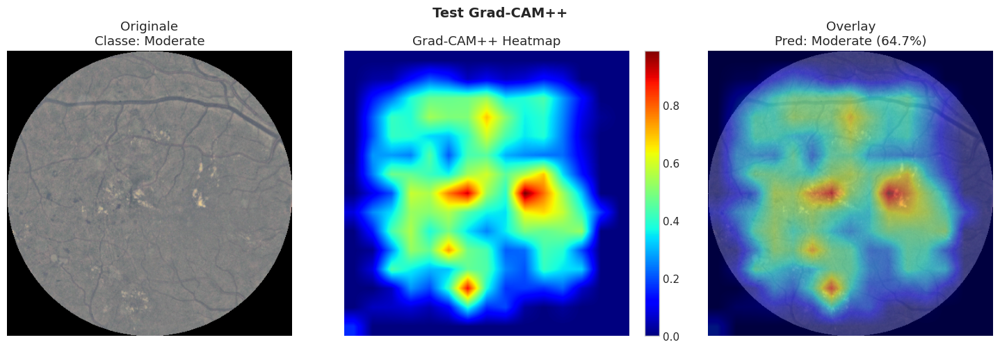

In [13]:
# Visualizza risultato test
overlay, heatmap_resized = overlay_heatmap(original_image, heatmap, ALPHA, COLORMAP)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Originale
axes[0].imshow(original_image)
axes[0].set_title(f'Originale\nClasse: {CLASS_NAMES[sample_row["diagnosis"]]}')
axes[0].axis('off')

# Heatmap
im = axes[1].imshow(heatmap_resized, cmap=COLORMAP)
axes[1].set_title('Grad-CAM++ Heatmap')
axes[1].axis('off')
plt.colorbar(im, ax=axes[1], fraction=0.046)

# Overlay
axes[2].imshow(overlay)
axes[2].set_title(f'Overlay\nPred: {CLASS_NAMES[pred_class]} ({confidence*100:.1f}%)')
axes[2].axis('off')

plt.suptitle('Test Grad-CAM++', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

Confronto Grad-CAM++ su diversi layer
Layer blocks.2: completato
Layer blocks.3: completato
Layer blocks.4: completato
Layer blocks.5: completato
Layer blocks.6: completato


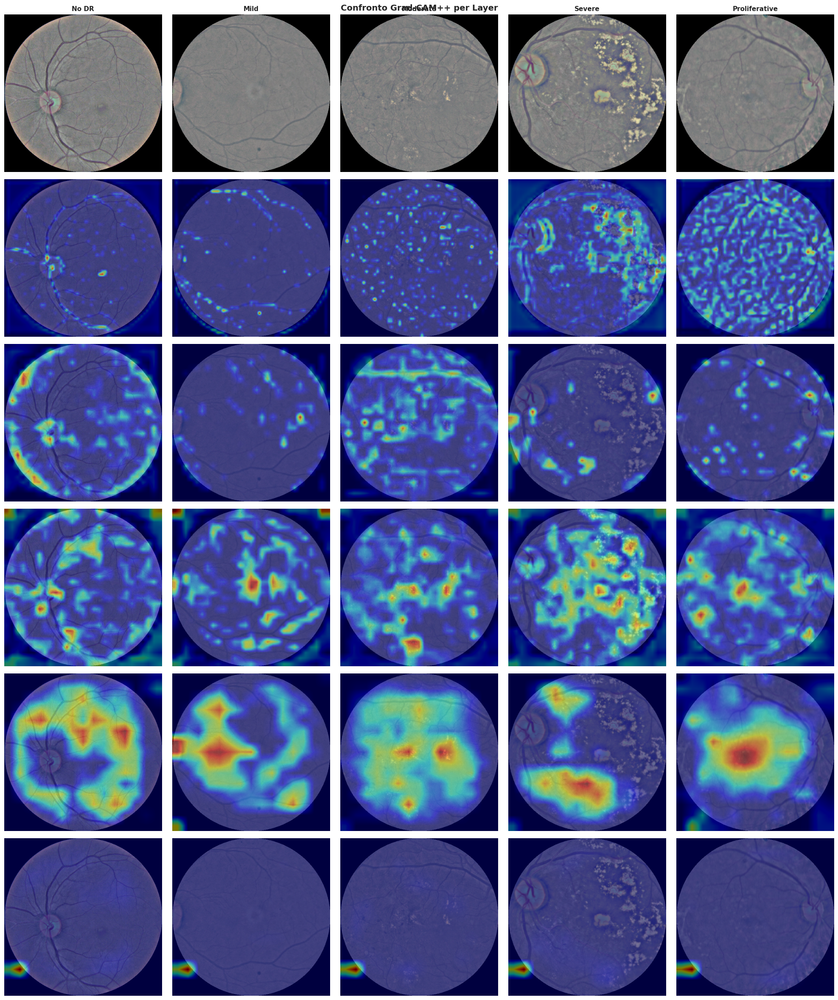


Salvato: /mnt/c/Repository/multi-method-xai-diabetic-retinopathy/results/gradcam/gradcam_layer_comparison.png


In [14]:
# Confronto tra diversi layer target
print("Confronto Grad-CAM++ su diversi layer")
print("=" * 60)

# Layer da testare (dal meno profondo al piu profondo)
test_layers = ['blocks.2', 'blocks.3', 'blocks.4', 'blocks.5', 'blocks.6']

# Seleziona immagini di test (una per classe)
test_images = []
for cls in range(NUM_CLASSES):
    cls_df = val_df[val_df['diagnosis'] == cls]
    if len(cls_df) > 0:
        row = cls_df.iloc[0]
        input_tensor, original = load_and_preprocess_image(row['preprocessed_path'], PROJECT_ROOT)
        test_images.append({
            'tensor': input_tensor.to(DEVICE),
            'original': original,
            'class': cls,
            'name': CLASS_NAMES[cls]
        })

# Genera heatmap per ogni layer e immagine
layer_results = {layer: [] for layer in test_layers}

for layer in test_layers:
    gradcam = GradCAMPlusPlus(model, layer)
    
    for img_data in test_images:
        heatmap, pred_class, confidence = gradcam(img_data['tensor'])
        _, heatmap_resized = overlay_heatmap(img_data['original'], heatmap, ALPHA, COLORMAP)
        
        layer_results[layer].append({
            'heatmap': heatmap_resized,
            'original': img_data['original'],
            'true_class': img_data['class'],
            'pred_class': pred_class,
            'confidence': confidence
        })
    
    gradcam.remove_hooks()
    print(f"Layer {layer}: completato")

# Visualizza griglia comparativa
n_layers = len(test_layers)
n_images = len(test_images)

fig, axes = plt.subplots(n_layers + 1, n_images, figsize=(n_images * 4, (n_layers + 1) * 4))

# Prima riga: immagini originali
for j, img_data in enumerate(test_images):
    axes[0, j].imshow(img_data['original'])
    axes[0, j].set_title(f"{img_data['name']}", fontsize=11, fontweight='bold')
    axes[0, j].axis('off')
    if j == 0:
        axes[0, j].set_ylabel('Originale', fontsize=10, fontweight='bold')

# Righe successive: heatmap per ogni layer
for i, layer in enumerate(test_layers):
    for j, result in enumerate(layer_results[layer]):
        overlay, _ = overlay_heatmap(result['original'], result['heatmap'], ALPHA, COLORMAP)
        axes[i + 1, j].imshow(overlay)
        axes[i + 1, j].axis('off')
        if j == 0:
            axes[i + 1, j].set_ylabel(layer, fontsize=10, fontweight='bold')

plt.suptitle('Confronto Grad-CAM++ per Layer', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(GRADCAM_DIR / 'gradcam_layer_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"\nSalvato: {GRADCAM_DIR / 'gradcam_layer_comparison.png'}")

## 3. Visualizzazione per Classe

In [15]:
def generate_gradcam_for_samples(model, df, project_root, target_layer, 
                                  samples_per_class=3, device='cuda'):
    """
    Genera Grad-CAM++ per campioni di ogni classe.
    
    Args:
        model: Modello PyTorch
        df: DataFrame con le immagini
        project_root: Root del progetto
        target_layer: Layer target per Grad-CAM
        samples_per_class: Numero di campioni per classe
        device: Device per inference
        
    Returns:
        results: Lista di dizionari con risultati
    """
    results = []
    gradcam = GradCAMPlusPlus(model, target_layer)
    
    for cls in range(NUM_CLASSES):
        cls_df = df[df['diagnosis'] == cls]
        
        if len(cls_df) == 0:
            print(f"Classe {cls}: nessun campione")
            continue
        
        # Seleziona campioni casuali
        n_samples = min(samples_per_class, len(cls_df))
        samples = cls_df.sample(n=n_samples, random_state=SEED)
        
        for idx, row in samples.iterrows():
            img_path = row['preprocessed_path']
            
            # Carica e processa
            input_tensor, original = load_and_preprocess_image(img_path, project_root)
            input_tensor = input_tensor.to(device)
            
            # Genera Grad-CAM++
            heatmap, pred_class, confidence = gradcam(input_tensor)
            
            # Overlay
            overlay, heatmap_resized = overlay_heatmap(original, heatmap, ALPHA, COLORMAP)
            
            results.append({
                'image_path': img_path,
                'true_class': cls,
                'pred_class': pred_class,
                'confidence': confidence,
                'original': original,
                'heatmap': heatmap_resized,
                'overlay': overlay,
                'correct': cls == pred_class
            })
    
    gradcam.remove_hooks()
    return results


print(f"Generazione Grad-CAM++ per {SAMPLES_PER_CLASS} campioni per classe...")
results = generate_gradcam_for_samples(
    model, val_df, PROJECT_ROOT, TARGET_LAYER,
    samples_per_class=SAMPLES_PER_CLASS,
    device=DEVICE
)
print(f"Generati {len(results)} risultati")

Generazione Grad-CAM++ per 3 campioni per classe...
Generati 15 risultati


Figura salvata: /mnt/c/Repository/multi-method-xai-diabetic-retinopathy/results/gradcam/gradcam_grid_by_class.png


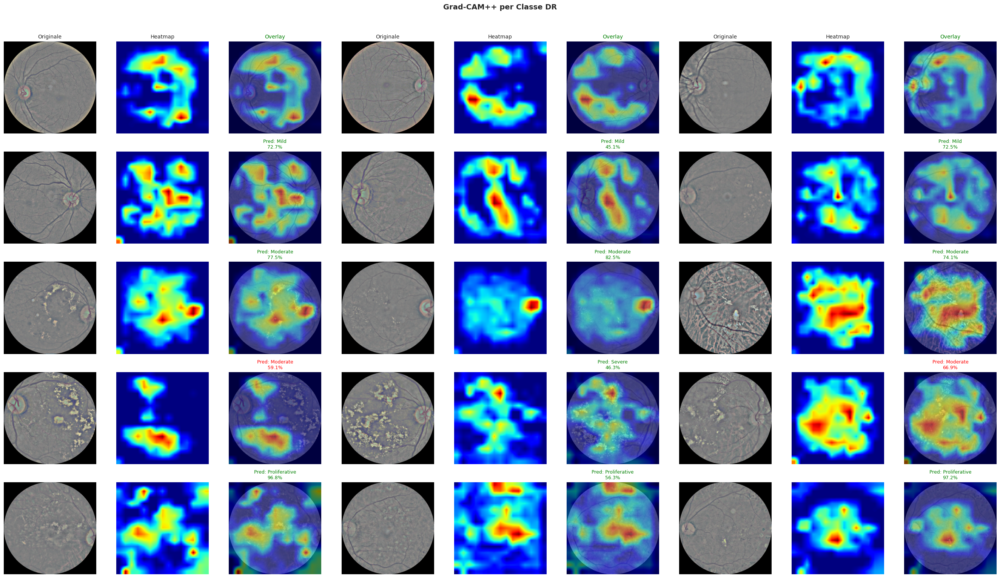

In [16]:
def plot_gradcam_grid(results, class_names, save_path=None):
    """
    Visualizza griglia di risultati Grad-CAM++ per classe.
    
    Args:
        results: Lista di risultati da generate_gradcam_for_samples
        class_names: Dizionario con nomi delle classi
        save_path: Path per salvare la figura
    """
    # Organizza per classe
    by_class = {i: [] for i in range(len(class_names))}
    for r in results:
        by_class[r['true_class']].append(r)
    
    # Calcola dimensioni griglia
    n_classes = len(class_names)
    max_samples = max(len(v) for v in by_class.values())
    
    if max_samples == 0:
        print("Nessun risultato da visualizzare")
        return
    
    # Crea figura: 3 colonne per campione (originale, heatmap, overlay)
    fig, axes = plt.subplots(
        n_classes, max_samples * 3, 
        figsize=(max_samples * 9, n_classes * 3)
    )
    
    if n_classes == 1:
        axes = axes.reshape(1, -1)
    
    for cls in range(n_classes):
        cls_results = by_class[cls]
        
        for sample_idx in range(max_samples):
            col_base = sample_idx * 3
            
            if sample_idx < len(cls_results):
                r = cls_results[sample_idx]
                
                # Originale
                axes[cls, col_base].imshow(r['original'])
                if sample_idx == 0:
                    axes[cls, col_base].set_ylabel(
                        f"{class_names[cls]}", 
                        fontsize=10, fontweight='bold'
                    )
                axes[cls, col_base].axis('off')
                
                # Heatmap
                axes[cls, col_base + 1].imshow(r['heatmap'], cmap=COLORMAP)
                axes[cls, col_base + 1].axis('off')
                
                # Overlay
                axes[cls, col_base + 2].imshow(r['overlay'])
                
                # Titolo con predizione
                color = 'green' if r['correct'] else 'red'
                pred_text = f"Pred: {class_names[r['pred_class']]}\n{r['confidence']*100:.1f}%"
                axes[cls, col_base + 2].set_title(pred_text, fontsize=9, color=color)
                axes[cls, col_base + 2].axis('off')
            else:
                # Celle vuote
                for offset in range(3):
                    axes[cls, col_base + offset].axis('off')
    
    # Titoli colonne
    for sample_idx in range(max_samples):
        col_base = sample_idx * 3
        axes[0, col_base].set_title('Originale', fontsize=10)
        axes[0, col_base + 1].set_title('Heatmap', fontsize=10)
        axes[0, col_base + 2].set_title('Overlay', fontsize=10)
    
    plt.suptitle('Grad-CAM++ per Classe DR', fontsize=14, fontweight='bold', y=1.02)
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
        print(f"Figura salvata: {save_path}")
    
    plt.show()


# Visualizza griglia
plot_gradcam_grid(
    results, 
    CLASS_NAMES,
    save_path=GRADCAM_DIR / 'gradcam_grid_by_class.png'
)

Visualizzazione dettagliata per classe:

Classe 0: No DR


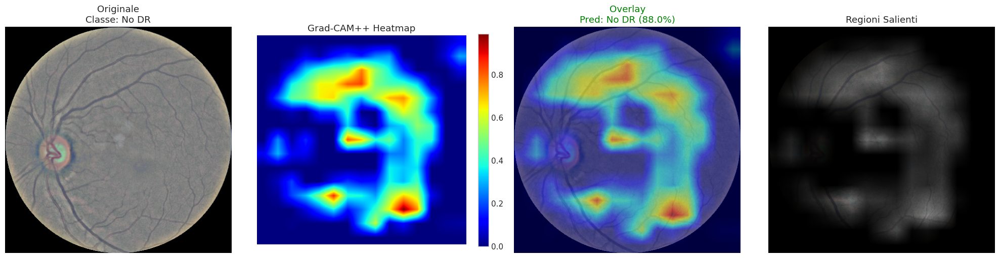


Classe 1: Mild


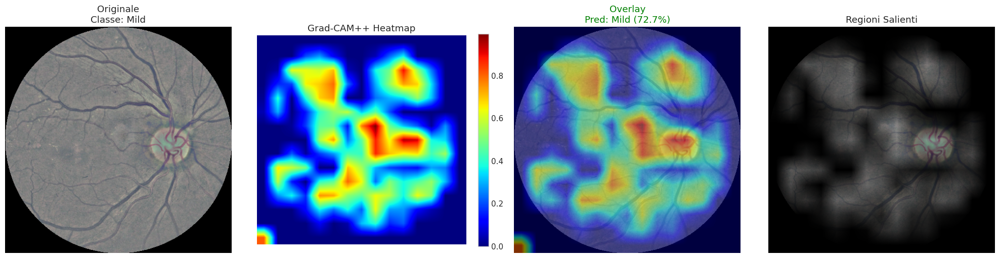


Classe 2: Moderate


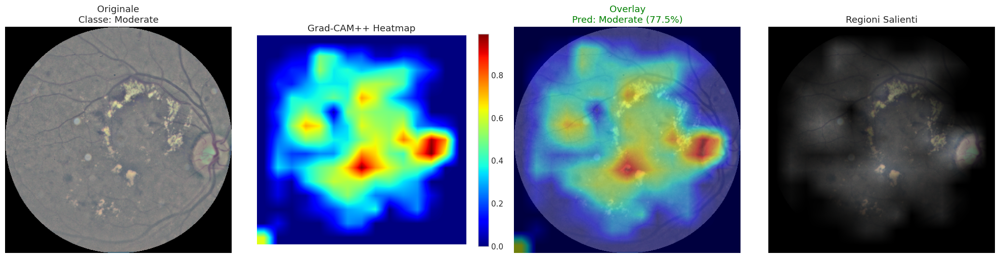


Classe 3: Severe


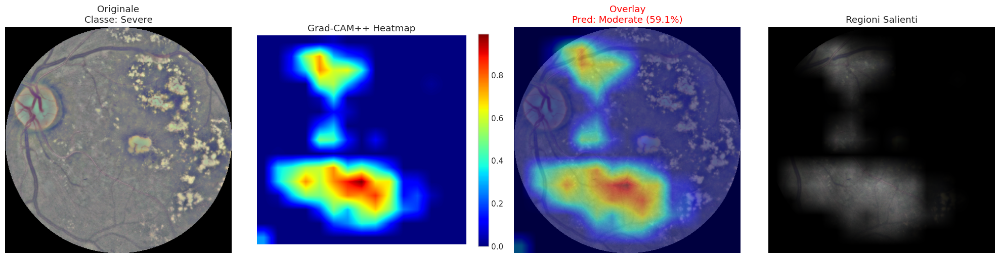


Classe 4: Proliferative


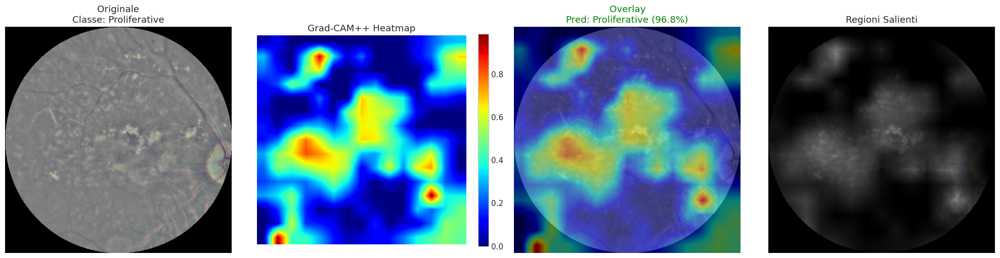

In [17]:
def plot_single_sample_detailed(result, class_names, save_path=None):
    """
    Visualizzazione dettagliata di un singolo campione.
    
    Args:
        result: Dizionario con risultato Grad-CAM
        class_names: Nomi delle classi
        save_path: Path per salvare
    """
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    
    # Originale
    axes[0].imshow(result['original'])
    axes[0].set_title(f"Originale\nClasse: {class_names[result['true_class']]}")
    axes[0].axis('off')
    
    # Heatmap
    im = axes[1].imshow(result['heatmap'], cmap=COLORMAP)
    axes[1].set_title('Grad-CAM++ Heatmap')
    axes[1].axis('off')
    plt.colorbar(im, ax=axes[1], fraction=0.046)
    
    # Overlay
    axes[2].imshow(result['overlay'])
    color = 'green' if result['correct'] else 'red'
    axes[2].set_title(
        f"Overlay\nPred: {class_names[result['pred_class']]} ({result['confidence']*100:.1f}%)",
        color=color
    )
    axes[2].axis('off')
    
    # Heatmap su sfondo nero (solo regioni salienti)
    masked = result['original'].copy().astype(float)
    mask = result['heatmap'][:, :, np.newaxis]
    masked = masked * mask
    masked = np.clip(masked, 0, 255).astype(np.uint8)
    axes[3].imshow(masked)
    axes[3].set_title('Regioni Salienti')
    axes[3].axis('off')
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
    
    plt.show()


# Visualizza campione dettagliato per ogni classe
print("Visualizzazione dettagliata per classe:")
print("=" * 60)

for cls in range(NUM_CLASSES):
    cls_results = [r for r in results if r['true_class'] == cls]
    if cls_results:
        print(f"\nClasse {cls}: {CLASS_NAMES[cls]}")
        plot_single_sample_detailed(
            cls_results[0], 
            CLASS_NAMES,
            save_path=GRADCAM_DIR / f'gradcam_class_{cls}_{CLASS_NAMES[cls].replace(" ", "_")}.png'
        )

In [18]:
# Statistiche predizioni
print("Statistiche Predizioni sui Campioni")
print("=" * 60)

correct = sum(1 for r in results if r['correct'])
total = len(results)
print(f"Accuracy sui campioni: {correct}/{total} ({correct/total*100:.1f}%)")

print("\nPer classe:")
for cls in range(NUM_CLASSES):
    cls_results = [r for r in results if r['true_class'] == cls]
    if cls_results:
        cls_correct = sum(1 for r in cls_results if r['correct'])
        avg_conf = np.mean([r['confidence'] for r in cls_results])
        print(f"  Classe {cls} ({CLASS_NAMES[cls]}): {cls_correct}/{len(cls_results)} corretti, conf. media: {avg_conf*100:.1f}%")

Statistiche Predizioni sui Campioni
Accuracy sui campioni: 13/15 (86.7%)

Per classe:
  Classe 0 (No DR): 3/3 corretti, conf. media: 84.9%
  Classe 1 (Mild): 3/3 corretti, conf. media: 63.4%
  Classe 2 (Moderate): 3/3 corretti, conf. media: 78.0%
  Classe 3 (Severe): 1/3 corretti, conf. media: 57.4%
  Classe 4 (Proliferative): 3/3 corretti, conf. media: 83.4%


In [19]:
# Salva campioni individuali se configurato
if VIS_CONFIG['save_individual']:
    print("\nSalvataggio immagini individuali...")
    
    individual_dir = GRADCAM_DIR / 'individual'
    individual_dir.mkdir(exist_ok=True)
    
    for i, r in enumerate(tqdm(results, desc='Salvataggio')):
        # Nome file
        img_name = Path(r['image_path']).stem
        cls_name = CLASS_NAMES[r['true_class']].replace(' ', '_')
        
        # Salva overlay
        overlay_path = individual_dir / f"{cls_name}_{img_name}_overlay.png"
        overlay_bgr = cv2.cvtColor(r['overlay'], cv2.COLOR_RGB2BGR)
        cv2.imwrite(str(overlay_path), overlay_bgr)
        
        # Salva heatmap
        heatmap_path = individual_dir / f"{cls_name}_{img_name}_heatmap.png"
        heatmap_colored = apply_colormap(r['heatmap'], COLORMAP)
        heatmap_bgr = cv2.cvtColor(heatmap_colored, cv2.COLOR_RGB2BGR)
        cv2.imwrite(str(heatmap_path), heatmap_bgr)
    
    print(f"Salvate {len(results) * 2} immagini in {individual_dir}")


Salvataggio immagini individuali...


Salvataggio:   0%|          | 0/15 [00:00<?, ?it/s]

Salvate 30 immagini in /mnt/c/Repository/multi-method-xai-diabetic-retinopathy/results/gradcam/individual


In [20]:
# Riepilogo
print("\n" + "=" * 70)
print("RIEPILOGO")
print("=" * 70)
print(f"\nModello: {MODEL_CONFIG['architecture']}")
print(f"Target layer: {TARGET_LAYER}")
print(f"Metodo: Grad-CAM++")
print(f"\nCampioni analizzati: {len(results)}")
print(f"Accuracy campioni: {correct/total*100:.1f}%")
print(f"\nOutput salvati in: {GRADCAM_DIR}")
print(f"  - gradcam_grid_by_class.png")
print(f"  - gradcam_class_*.png (per ogni classe)")
if VIS_CONFIG['save_individual']:
    print(f"  - individual/*.png ({len(results)*2} file)")


RIEPILOGO

Modello: efficientnet_b5
Target layer: blocks.5
Metodo: Grad-CAM++

Campioni analizzati: 15
Accuracy campioni: 86.7%

Output salvati in: /mnt/c/Repository/multi-method-xai-diabetic-retinopathy/results/gradcam
  - gradcam_grid_by_class.png
  - gradcam_class_*.png (per ogni classe)
  - individual/*.png (30 file)


## Conclusioni

### Output Generati

1. **Visualizzazioni**:
   - `results/gradcam/gradcam_grid_by_class.png`: Griglia con tutti i campioni
   - `results/gradcam/gradcam_class_*.png`: Dettaglio per ogni classe
   - `results/gradcam/individual/`: Immagini individuali

### Interpretazione

Le heatmap Grad-CAM++ evidenziano:
- **No DR (0)**: Focus su aree sane della retina
- **Mild (1)**: Microaneurismi isolati
- **Moderate (2)**: Emorragie e essudati
- **Severe (3)**: Lesioni multiple e diffuse
- **Proliferative (4)**: Neovascolarizzazione

### Prossimi Passi

1. Notebook 06: Validazione quantitativa IoU su DDR dataset
2. Notebook 07: Clustering activation patterns
3. Notebook 08: Rule Extraction (Fase 3)